In [1]:
import pandas as pd
import pandas_profiling as profile
import numpy as np
import seaborn as sns
import plotly as py
import plotly.graph_objs as go
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df = pd.read_csv("G:/Education/Machine Learning/ML_DATA_FILES/online_shoppers_intention.csv")
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0.0,-1.0,0.0,-1.0,1.0,-1.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [3]:
df.shape

(12330, 18)

In [4]:
df.isnull().sum()

Administrative             14
Administrative_Duration    14
Informational              14
Informational_Duration     14
ProductRelated             14
ProductRelated_Duration    14
BounceRates                14
ExitRates                  14
PageValues                  0
SpecialDay                  0
Month                       0
OperatingSystems            0
Browser                     0
Region                      0
TrafficType                 0
VisitorType                 0
Weekend                     0
Revenue                     0
dtype: int64

In [5]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.317798,80.906176,0.503979,34.506387,31.763884,1196.037057,0.022152,0.043003,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.322754,176.860432,1.270701,140.825479,44.490339,1914.372511,0.048427,0.048527,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,-1.000000,0.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,185.000000,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,8.000000,0.000000,0.000000,18.000000,599.766190,0.003119,0.025124,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.500000,0.000000,0.000000,38.000000,1466.479902,0.016684,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [6]:
df.profile_report()

C:\Users\varun\anaconda3\envs\condaenv\lib\site-packages\seaborn\distributions.py:283: UserWarning:

Data must have variance to compute a kernel density estimate.



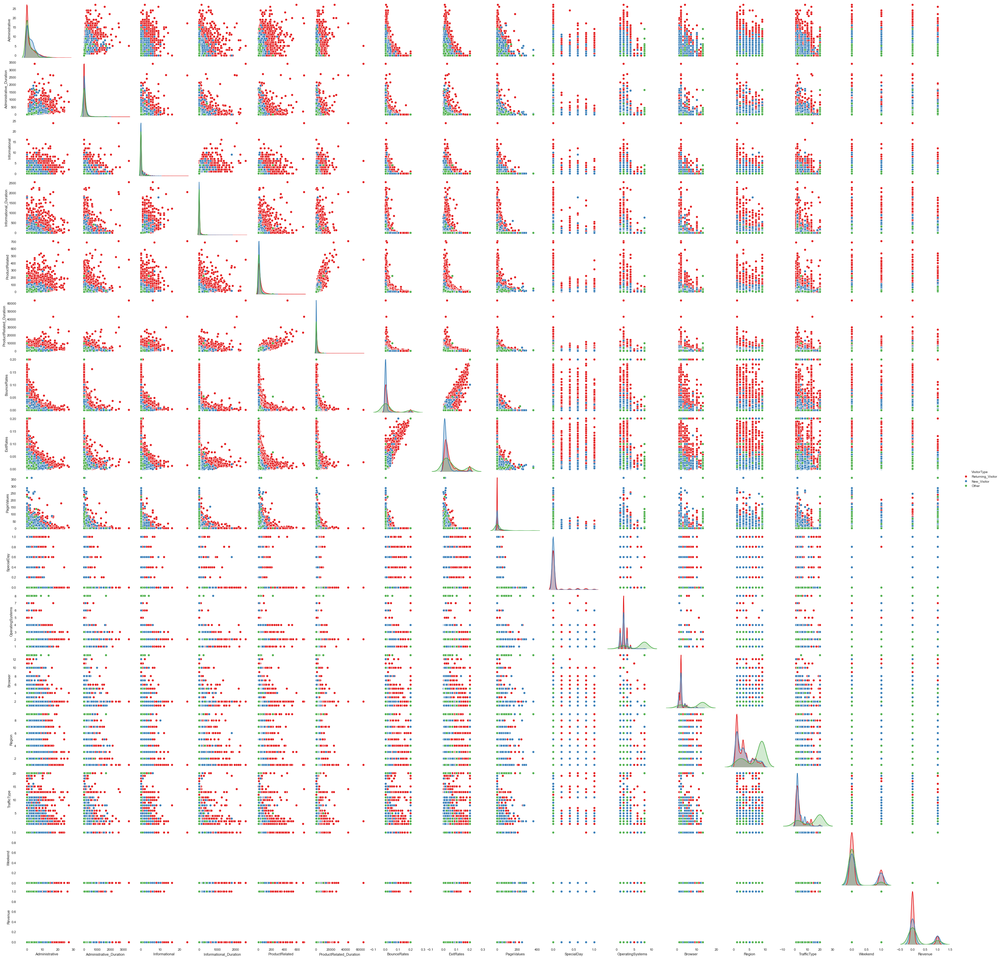

In [7]:
sns.pairplot(hue = "VisitorType", data = df, palette='Set1')

### Univariate Analysis of data

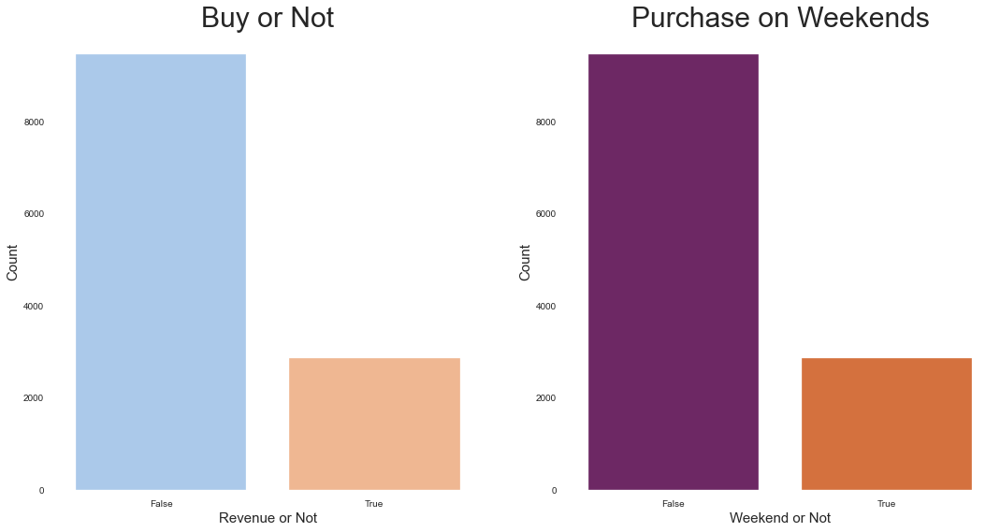

In [8]:
plt.figure(figsize = (18,9))

plt.subplot(1,2,1)
sns.countplot(df['Weekend'], palette='pastel')
plt.title('Buy or Not', fontsize=30)
plt.xlabel('Revenue or Not', fontsize = 15)
plt.ylabel('Count', fontsize = 15)

plt.subplot(1,2,2)
sns.countplot(df['Weekend'], palette='inferno')
plt.title('Purchase on Weekends', fontsize=30)
plt.xlabel('Weekend or Not', fontsize = 15)
plt.ylabel('Count', fontsize = 15)

plt.show()

In [9]:
df['VisitorType'].value_counts()

Returning_Visitor    10551
New_Visitor           1694
Other                   85
Name: VisitorType, dtype: int64

In [10]:
df['Browser'].value_counts()

2     7961
1     2462
4      736
5      467
6      174
10     163
8      135
3      105
13      61
7       49
12      10
11       6
9        1
Name: Browser, dtype: int64

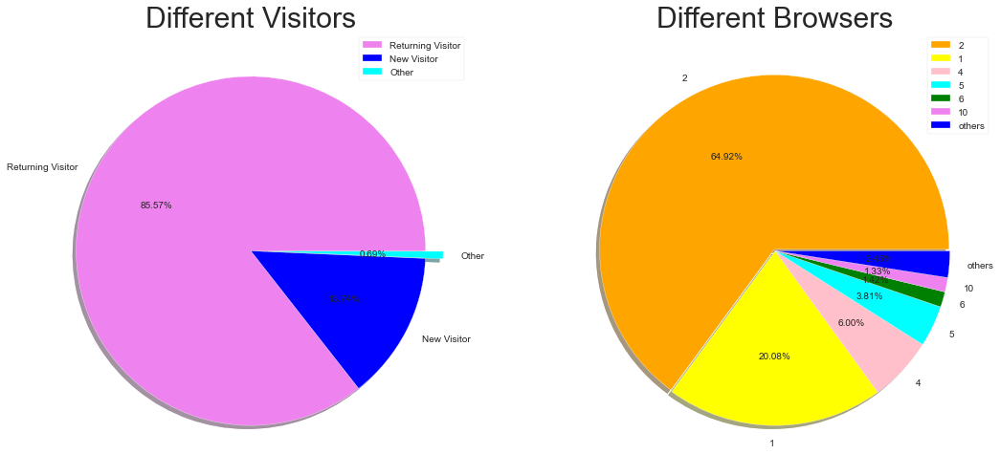

In [11]:
plt.figure(figsize=(18,9))
size = [10551, 1694, 85]
colors = ['violet', 'blue', 'cyan']
labels = 'Returning Visitor', 'New Visitor', 'Other'
explode = [0,0,0.1]

plt.subplot(1,2,1)
plt.pie(size, colors = colors, labels=labels, explode=explode, shadow= True, autopct = '%.2f%%')
plt.title("Different Visitors", fontsize=30)
plt.axis('off')
plt.legend()

size = [7961, 2462, 736, 467, 174, 163, 300]
colors = ['orange', 'yellow', 'pink', 'cyan', 'green', 'violet', 'blue']
labels = "2", "1", "4", "5", "6", "10", "others"
explode = [0.01,0,0,0,0,0,0]

plt.subplot(1,2,2)
plt.pie(size, colors = colors, labels=labels, explode=explode, shadow=True, autopct='%.2f%%')
plt.title("Different Browsers", fontsize = 30)
plt.axis('off')
plt.legend()

plt.show()

### Region

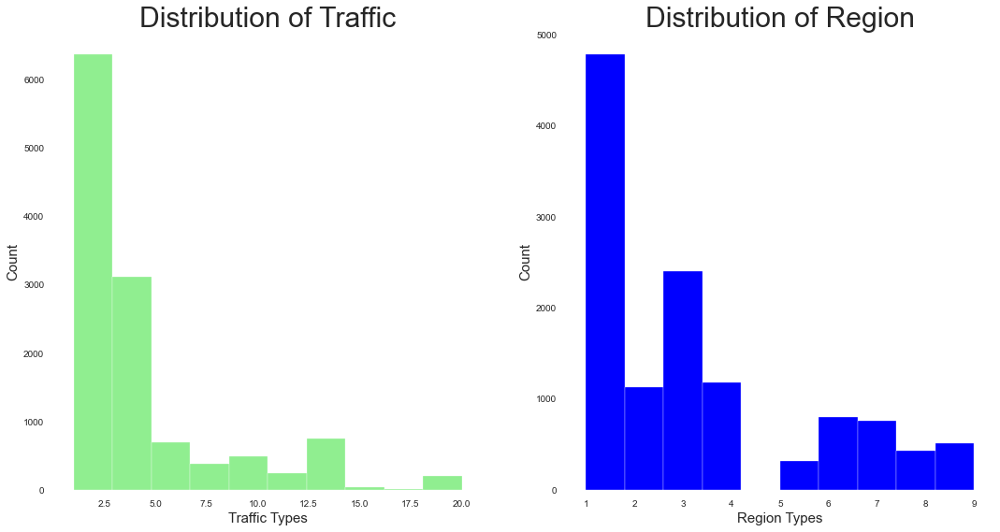

In [12]:
plt.figure(figsize = (18,9))

plt.subplot(1,2,1)
plt.hist(df['TrafficType'], color = 'lightgreen')
plt.title("Distribution of Traffic", fontsize = 30)
plt.xlabel('Traffic Types', fontsize = 15)
plt.ylabel('Count', fontsize = 15)

plt.subplot(1,2,2)
plt.hist(df['Region'], color = 'blue')
plt.title("Distribution of Region", fontsize = 30)
plt.xlabel('Region Types', fontsize = 15)
plt.ylabel('Count', fontsize = 15)

plt.show()

In [13]:
df['OperatingSystems'].value_counts()

2    6601
1    2585
3    2555
4     478
8      79
6      19
7       7
5       6
Name: OperatingSystems, dtype: int64

In [14]:
df['Month'].value_counts()

May     3364
Nov     2998
Mar     1907
Dec     1727
Oct      549
Sep      448
Aug      433
Jul      432
June     288
Feb      184
Name: Month, dtype: int64

### Pie Charts for different Operating Systems & Share of special days in month

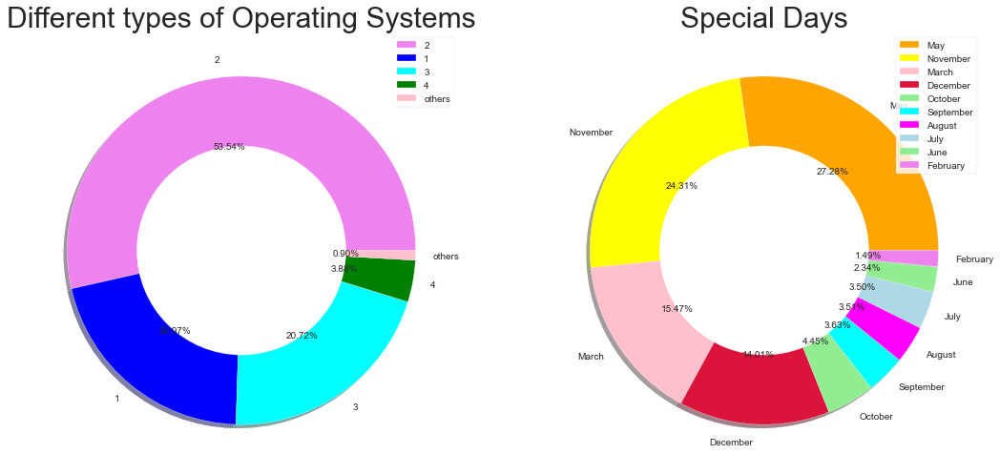

In [15]:
plt.figure(figsize=(18,9))
size = [6601, 2585, 2555, 478, 111]
colors = ['violet', 'blue', 'cyan', 'green', 'pink']
labels = "2", "1", "3", "4", "others" 
explode = [0,0,0,0,0]

circle = plt.Circle((0,0), 0.6, color = 'white')

plt.subplot(1,2,1)
plt.pie(size, colors = colors, labels=labels, explode=explode, shadow= True, autopct = '%.2f%%')
plt.title("Different types of Operating Systems", fontsize=30)
p = plt.gcf()
p.gca().add_artist(circle)
plt.axis('off')
plt.legend()

size = [3364, 2998, 1907, 1727, 549, 448, 433, 432, 288, 184]
colors = ['orange', 'yellow', 'pink', 'crimson', 'lightgreen', 'cyan', 'magenta', 'lightblue', 'lightgreen', 'violet']
labels = "May", "November", "March", "December", "October", "September", "August", "July", "June", "February"
explode = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

circle = plt.Circle((0,0), 0.6, color = 'white')

plt.subplot(1,2,2)
plt.pie(size, colors = colors, labels=labels, explode=explode, shadow=True, autopct='%.2f%%')
plt.title("Special Days", fontsize = 30)
p = plt.gcf()
p.gca().add_artist(circle)
plt.axis('off')
plt.legend()

plt.show()

### Bi Variate Analysis

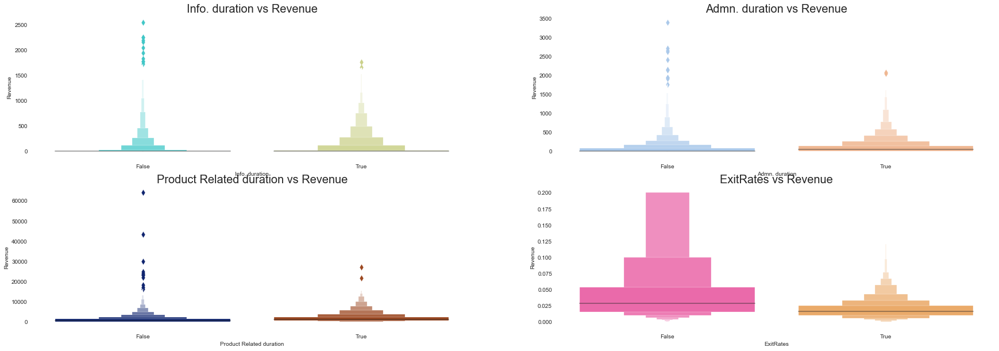

In [16]:
plt.figure(figsize = (30,10))

plt.subplot(2, 2, 1)
sns.boxenplot(df['Revenue'], df['Informational_Duration'], palette = 'rainbow')
plt.title('Info. duration vs Revenue', fontsize = 20)
plt.xlabel('Info. duration', fontsize = 10)
plt.ylabel('Revenue', fontsize = 10)

# product related duration vs revenue

plt.subplot(2, 2, 2)
sns.boxenplot(df['Revenue'], df['Administrative_Duration'], palette = 'pastel')
plt.title('Admn. duration vs Revenue', fontsize = 20)
plt.xlabel('Admn. duration', fontsize = 10)
plt.ylabel('Revenue', fontsize = 10)

# product related duration vs revenue

plt.subplot(2, 2, 3)
sns.boxenplot(df['Revenue'], df['ProductRelated_Duration'], palette = 'dark')
plt.title('Product Related duration vs Revenue', fontsize = 20)
plt.xlabel('Product Related duration', fontsize = 10)
plt.ylabel('Revenue', fontsize = 10)

# exit rate vs revenue

plt.subplot(2, 2, 4)
sns.boxenplot(df['Revenue'], df['ExitRates'], palette = 'spring')
plt.title('ExitRates vs Revenue', fontsize = 20)
plt.xlabel('ExitRates', fontsize = 10)
plt.ylabel('Revenue', fontsize = 10)


plt.show()

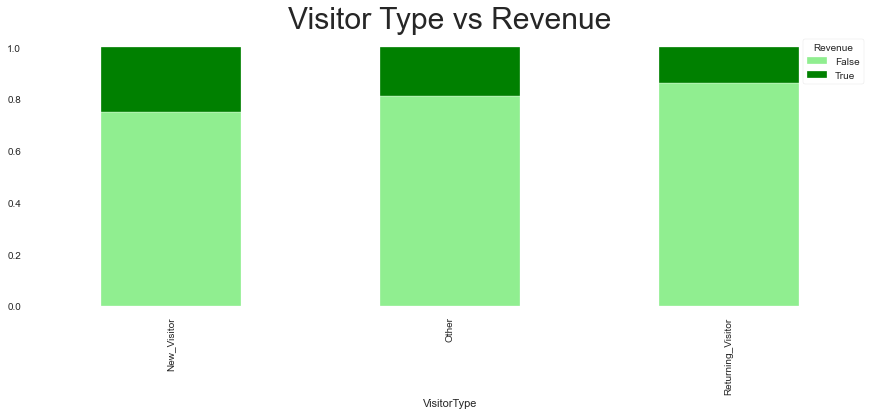

In [17]:
data = pd.crosstab(df['VisitorType'], df['Revenue'])
data.div(data.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5), color = ['lightgreen', 'green'])
plt.title('Visitor Type vs Revenue', fontsize = 30)
plt.show()

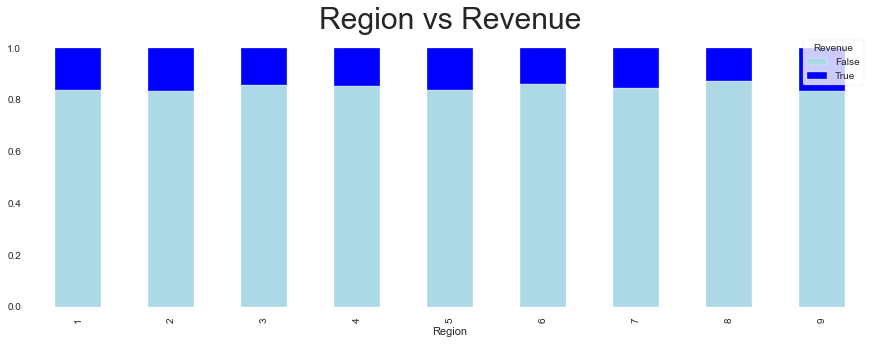

In [18]:
data = pd.crosstab(df['Region'], df['Revenue'])
data.div(data.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5), color = ['lightblue', 'blue'])
plt.title('Region vs Revenue', fontsize = 30)
plt.show()

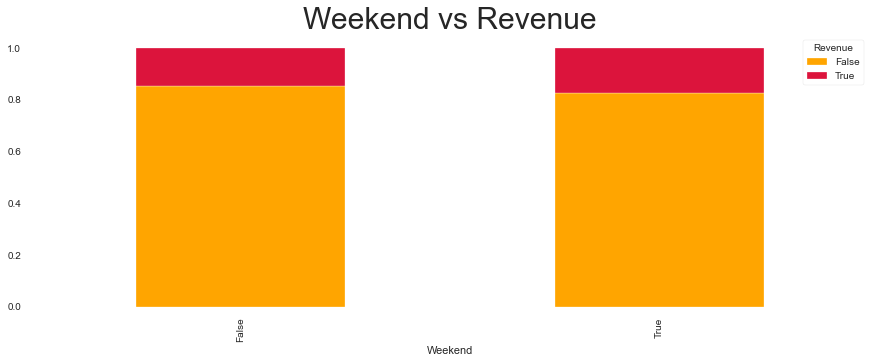

In [19]:
data = pd.crosstab(df['Weekend'], df['Revenue'])
data.div(data.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5), color = ['orange', 'crimson'])
plt.title('Weekend vs Revenue', fontsize = 30)
plt.show()

In [20]:
df.fillna(0, inplace=True)

In [21]:
df.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

# Clustering Analysis

## K Means Clustering

In [22]:
from sklearn.cluster import KMeans

### 1. Administrative Duration Vs Bounce Rate

#### Finding Number of clusters using ELBOW METHOD

In [23]:
x = df.loc[:,["Administrative_Duration", "BounceRates"]]

In [24]:
wcss = []

In [25]:
for i in range(1,15):
    kmeans = KMeans(n_clusters=i,
                    init = 'k-means++',
                    max_iter=300,
                    n_init=10,
                    random_state=0,
                    algorithm='elkan',
                    tol = 0.001)
    kmeans.fit(x)
    labels = kmeans.labels_
    wcss.append(kmeans.inertia_)

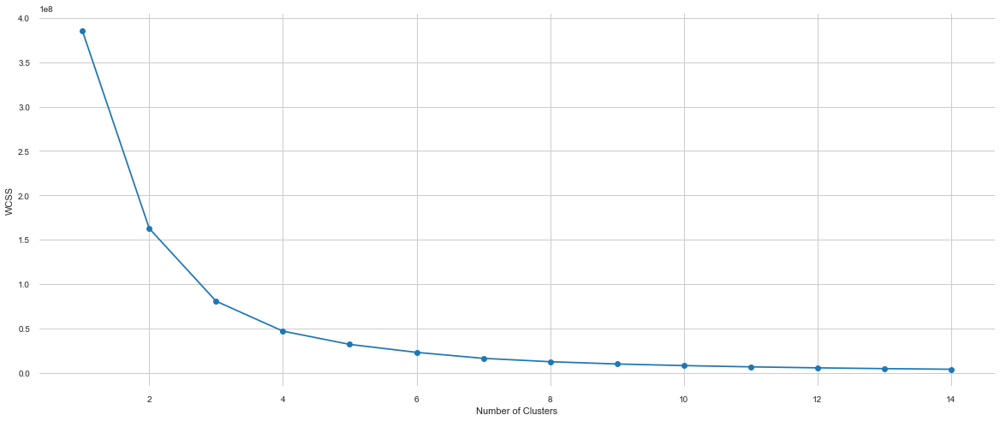

In [26]:
plt.figure(figsize = (20,8))
plt.plot(range(1,15), wcss, "-o")
plt.xlabel("Number of Clusters")
plt.ylabel("WCSS")
plt.grid()
plt.show()

The total number of clusters for Administrative Duration Vs Bounce Rate is "3"

#### Checking Whether the number of clusters developed by elbow method is correct or not

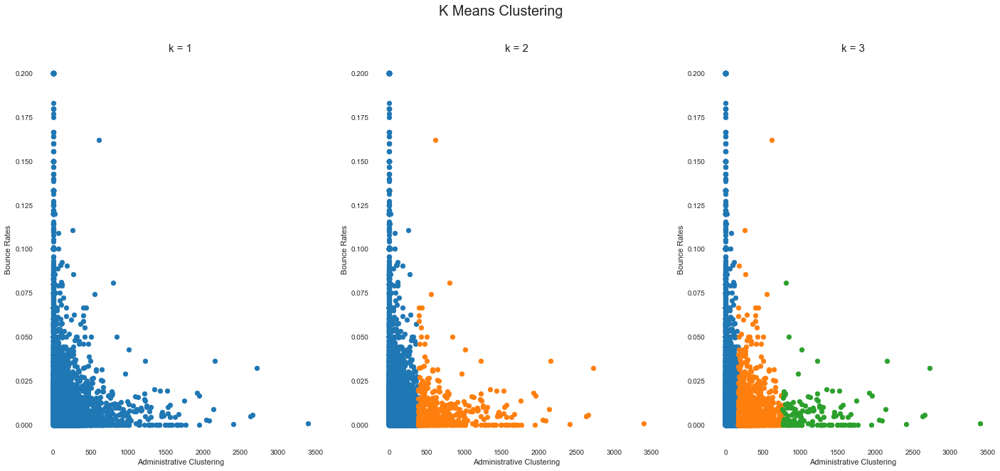

In [27]:
plt.figure(figsize = (24,10))
plt.suptitle("K Means Clustering", fontsize = 20)

plt.subplot(1,3,1)
plt.title("k = 1", fontsize = 15)
plt.xlabel("Administrative Clustering")
plt.ylabel("Bounce Rates")
plt.scatter(x.Administrative_Duration, x.BounceRates)

plt.subplot(1,3,2)
kmeans = KMeans(n_clusters=2)
x['scores'] = kmeans.fit_predict(x)
plt.title("k = 2", fontsize = 15)
plt.xlabel("Administrative Clustering")
plt.ylabel("Bounce Rates")
plt.scatter(x.Administrative_Duration[x.scores == 0], x.BounceRates[x.scores == 0])
plt.scatter(x.Administrative_Duration[x.scores == 1], x.BounceRates[x.scores == 1])

x.drop(['scores'], axis = 1, inplace = True)

plt.subplot(1,3,3)
kmeans = KMeans(n_clusters=3)
x['scores'] = kmeans.fit_predict(x)
plt.title("k = 3", fontsize = 15)
plt.xlabel("Administrative Clustering")
plt.ylabel("Bounce Rates")
plt.scatter(x.Administrative_Duration[x.scores == 0], x.BounceRates[x.scores == 0])
plt.scatter(x.Administrative_Duration[x.scores == 1], x.BounceRates[x.scores == 1])
plt.scatter(x.Administrative_Duration[x.scores == 2], x.BounceRates[x.scores == 2])

plt.show()

#### Visualizing the scatter plot (K-Means Clustering)

In [28]:
x = df.iloc[:,[1,6]].values

In [29]:
kmeans = KMeans(n_clusters = 3, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
prediction = kmeans.fit_predict(x)

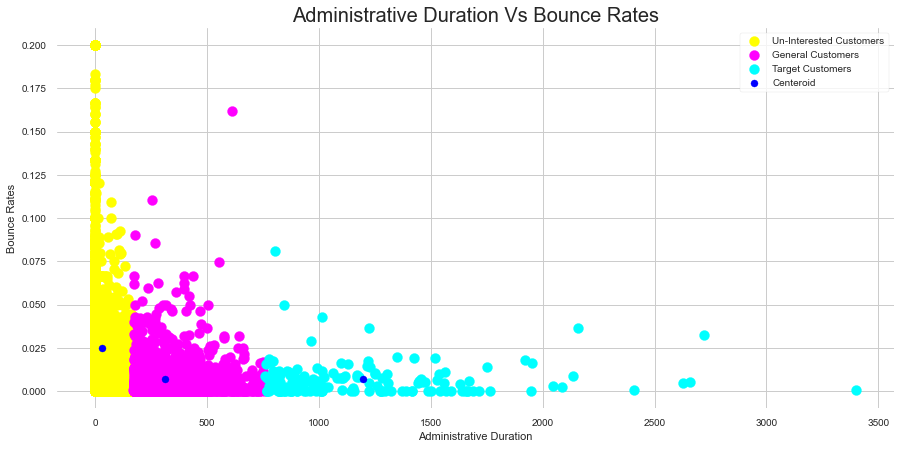

In [30]:
plt.figure(figsize = (15,7))

plt.scatter(x[prediction == 0, 0], x[prediction == 0, 1], s = 100, c = 'yellow', label = 'Un-Interested Customers')
plt.scatter(x[prediction == 1, 0], x[prediction == 1, 1], s = 100, c = 'magenta', label = 'General Customers')
plt.scatter(x[prediction == 2, 0], x[prediction == 2, 1], s = 100, c = 'cyan', label = 'Target Customers')

plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'Centeroid')

plt.title('Administrative Duration Vs Bounce Rates', fontsize = 20)
plt.xlabel('Administrative Duration')
plt.ylabel('Bounce Rates')
plt.legend()
plt.grid()
plt.show()

### 2. Informative Duration Vs Bounce Rates

#### Finding Number of clusters using ELBOW METHOD

In [31]:
x = df.loc[:,["Informational_Duration","BounceRates"]]

In [32]:
wcss = []

In [33]:
for i in range(1,15):
    kmeans = KMeans(n_clusters=i,
                    init = 'k-means++',
                    max_iter=300,
                    n_init=10,
                    random_state=0,
                    algorithm='elkan',
                    tol = 0.001)
    kmeans.fit(x)
    labels = kmeans.labels_
    wcss.append(kmeans.inertia_)

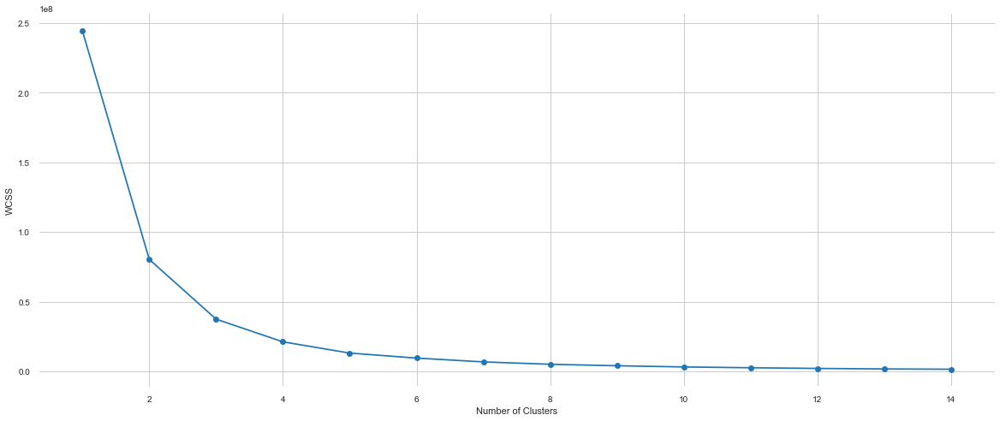

In [34]:
plt.figure(figsize = (20,8))
plt.plot(range(1,15), wcss, "-o")
plt.xlabel("Number of Clusters")
plt.ylabel("WCSS")
plt.grid()
plt.show()

The number of clusters in Informative Duration Vs Bounce Rates is 2

#### Checking Whether the number of clusters developed by elbow method is correct or not

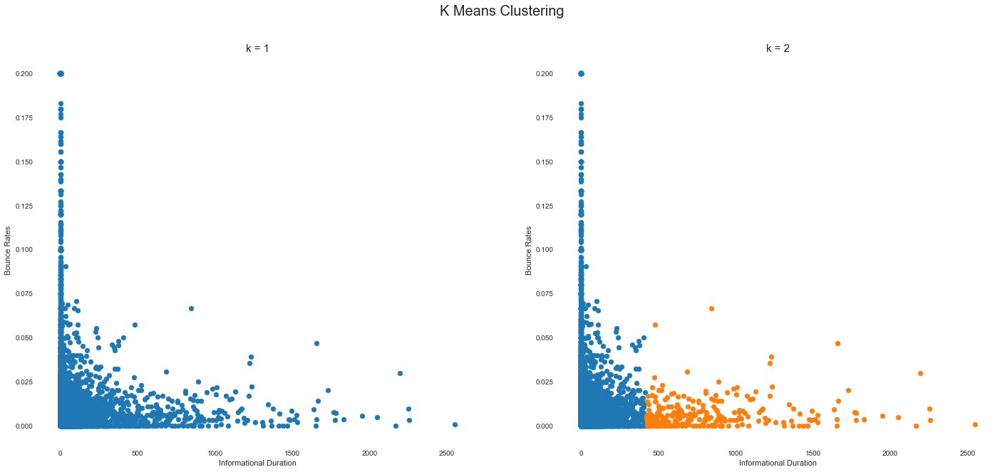

In [35]:
plt.figure(figsize = (24,10))
plt.suptitle("K Means Clustering", fontsize = 20)

plt.subplot(1,2,1)
plt.title("k = 1", fontsize = 15)
plt.xlabel("Informational Duration")
plt.ylabel("Bounce Rates")
plt.scatter(x.Informational_Duration, x.BounceRates)

plt.subplot(1,2,2)
kmeans = KMeans(n_clusters=2)
x['scores'] = kmeans.fit_predict(x)
plt.title("k = 2", fontsize = 15)
plt.xlabel("Informational Duration")
plt.ylabel("Bounce Rates")
plt.scatter(x.Informational_Duration[x.scores == 0], x.BounceRates[x.scores == 0])
plt.scatter(x.Informational_Duration[x.scores == 1], x.BounceRates[x.scores == 1])

x.drop(['scores'], axis = 1, inplace = True)

plt.show()

#### Visualizing K-Means Clustering.

In [36]:
x = df.iloc[:,[3,6]].values

In [37]:
kmeans = KMeans(n_clusters = 2, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
prediction1 = kmeans.fit_predict(x)

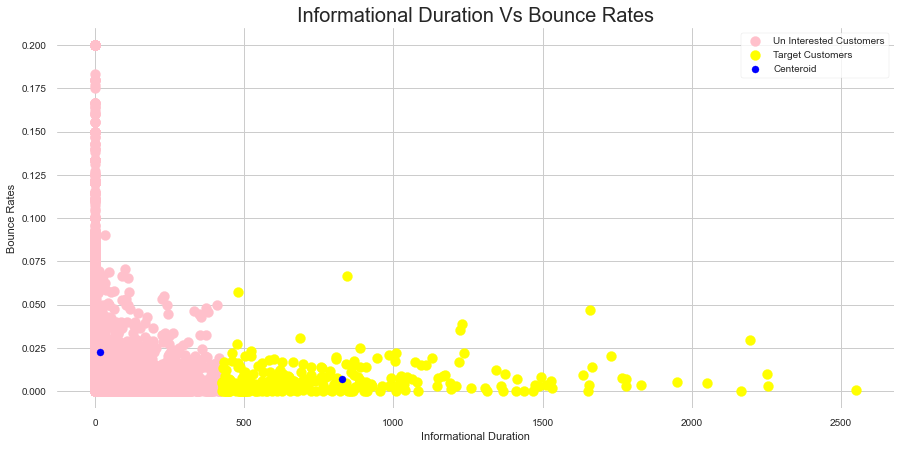

In [38]:
plt.figure(figsize = (15,7))

plt.scatter(x[prediction1 == 0, 0], x[prediction1 == 0, 1], s = 100, c = 'pink', label = 'Un Interested Customers')
plt.scatter(x[prediction1 == 1, 0], x[prediction1 == 1, 1], s = 100, c = 'yellow', label = 'Target Customers')
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'Centeroid')

plt.title('Informational Duration Vs Bounce Rates', fontsize = 20)
plt.xlabel('Informational Duration')
plt.ylabel('Bounce Rates')
plt.legend()
plt.grid()
plt.show()

### 3. Administrative Duration Vs Exit Rates

#### Finding Number of clusters using ELBOW METHOD

In [39]:
x = df.loc[:,["Administrative_Duration", "ExitRates"]]

In [40]:
wcss = []

In [41]:
for i in range(1,15):
    kmeans = KMeans(n_clusters=i,
                    init = 'k-means++',
                    max_iter=300,
                    n_init=10,
                    random_state=0,
                    algorithm='elkan',
                    tol = 0.001)
    kmeans.fit(x)
    labels = kmeans.labels_
    wcss.append(kmeans.inertia_)

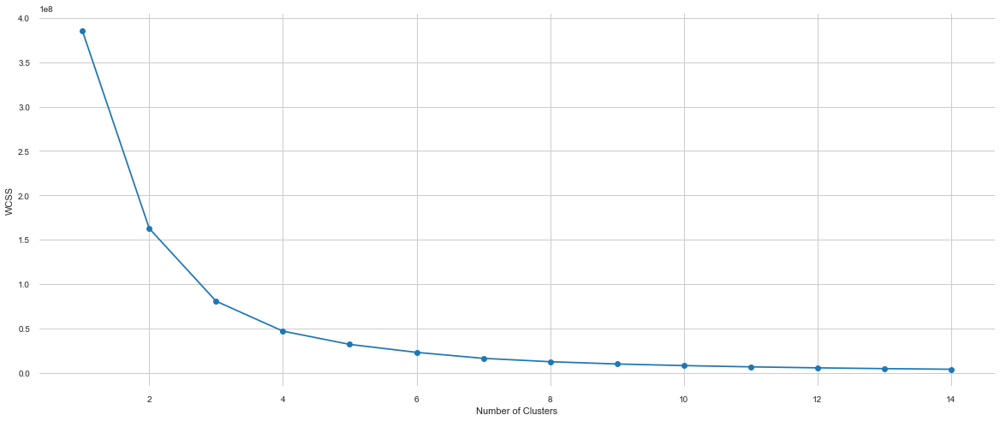

In [42]:
plt.figure(figsize = (20,8))
plt.plot(range(1,15), wcss, "-o")
plt.xlabel("Number of Clusters")
plt.ylabel("WCSS")
plt.grid()
plt.show()

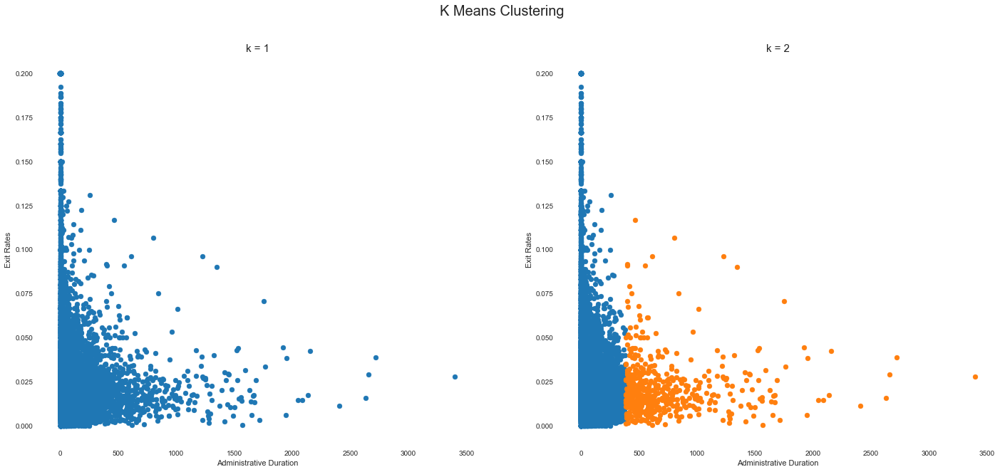

In [43]:
plt.figure(figsize = (24,10))
plt.suptitle("K Means Clustering", fontsize = 20)

plt.subplot(1,2,1)
plt.title("k = 1", fontsize = 15)
plt.xlabel("Administrative Duration")
plt.ylabel("Exit Rates")
plt.scatter(x.Administrative_Duration, x.ExitRates)

plt.subplot(1,2,2)
kmeans = KMeans(n_clusters=2)
x['scores'] = kmeans.fit_predict(x)
plt.title("k = 2", fontsize = 15)
plt.xlabel("Administrative Duration")
plt.ylabel("Exit Rates")
plt.scatter(x.Administrative_Duration[x.scores == 0], x.ExitRates[x.scores == 0])
plt.scatter(x.Administrative_Duration[x.scores == 1], x.ExitRates[x.scores == 1])

x.drop(['scores'], axis = 1, inplace = True)

plt.show()

In [44]:
x = df.iloc[:,[1,7]].values

In [45]:
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, max_iter=300, random_state = 0)
prediction2 = kmeans.fit_predict(x)

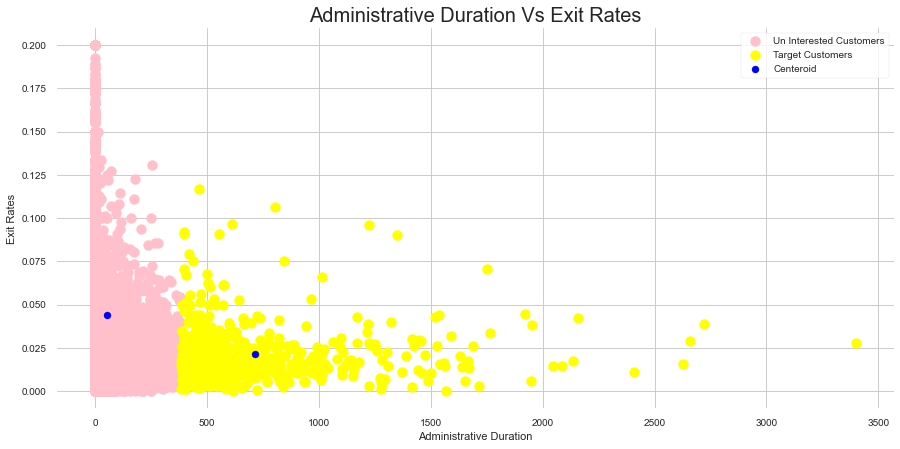

In [46]:
plt.figure(figsize = (15,7))

plt.scatter(x[prediction2 == 0, 0], x[prediction2 == 0, 1], s = 100, c = 'pink', label = 'Un Interested Customers')
plt.scatter(x[prediction2 == 1, 0], x[prediction2 == 1, 1], s = 100, c = 'yellow', label = 'Target Customers')
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'Centeroid')

plt.title('Administrative Duration Vs Exit Rates', fontsize = 20)
plt.xlabel('Administrative Duration')
plt.ylabel('Exit Rates')
plt.legend()
plt.grid()
plt.show()

#### 4. Region Vs Traffic Type

In [47]:
x = df.loc[:,["Region", "TrafficType"]]

In [48]:
wcss = []

In [49]:
for i in range(1,15):
    kmeans = KMeans(n_clusters = i,
                    init = 'k-means++',
                    n_init = 10,
                    max_iter = 300,
                    algorithm = 'elkan',
                    tol = 0.001)
    kmeans.fit(x)
    labels = kmeans.labels_
    wcss.append(kmeans.inertia_)

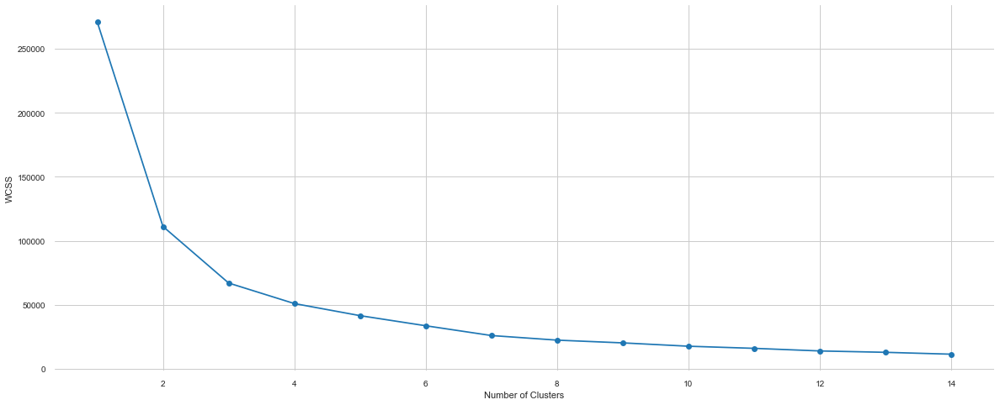

In [50]:
plt.figure(figsize = (20,8))
plt.plot(range(1,15), wcss, "-o")
plt.xlabel("Number of Clusters")
plt.ylabel("WCSS")
plt.grid()
plt.show()

Two clusters

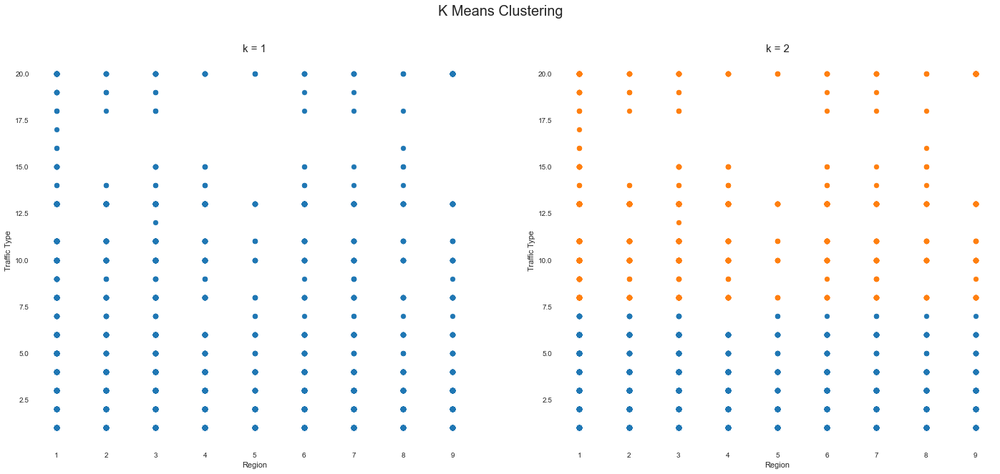

In [51]:
plt.figure(figsize = (24,10))
plt.suptitle("K Means Clustering", fontsize = 20)

plt.subplot(1,2,1)
plt.title("k = 1", fontsize = 15)
plt.xlabel("Region")
plt.ylabel("Traffic Type")
plt.scatter(x.Region, x.TrafficType)

plt.subplot(1,2,2)
kmeans = KMeans(n_clusters=2)
x['scores'] = kmeans.fit_predict(x)
plt.title("k = 2", fontsize = 15)
plt.xlabel("Region")
plt.ylabel("Traffic Type")
plt.scatter(x.Region[x.scores == 0], x.TrafficType[x.scores == 0])
plt.scatter(x.Region[x.scores == 1], x.TrafficType[x.scores == 1])

x.drop(['scores'], axis = 1, inplace = True)

plt.show()

In [52]:
x = df.iloc[:,[13,14]].values

In [53]:
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, max_iter=300, random_state = 0)
prediction3 = kmeans.fit_predict(x)

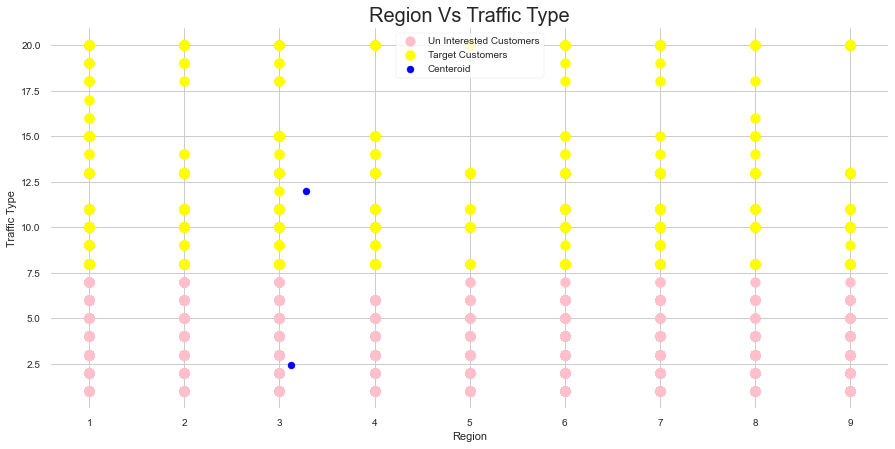

In [54]:
plt.figure(figsize = (15,7))

plt.scatter(x[prediction3 == 0, 0], x[prediction3 == 0, 1], s = 100, c = 'pink', label = 'Un Interested Customers')
plt.scatter(x[prediction3 == 1, 0], x[prediction3 == 1, 1], s = 100, c = 'yellow', label = 'Target Customers')
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'Centeroid')

plt.title('Region Vs Traffic Type', fontsize = 20)
plt.xlabel('Region')
plt.ylabel('Traffic Type')
plt.legend()
plt.grid()
plt.show()

## Data Pre Processing

In [55]:
df1 = pd.get_dummies(df)

In [56]:
from sklearn.preprocessing import LabelEncoder

In [57]:
le = LabelEncoder()

In [58]:
df['Revenue'] = le.fit_transform(df['Revenue'])
df['Revenue'].value_counts()

0    10422
1     1908
Name: Revenue, dtype: int64

In [59]:
x = df1.drop(['Revenue'], axis = 1)
y = df1['Revenue']

## Splitting Data

In [60]:
from sklearn.model_selection import train_test_split

In [61]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.3, random_state = 0)

In [62]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

## Random Forest Classifier

In [63]:
from sklearn.ensemble import RandomForestClassifier

In [64]:
model = RandomForestClassifier()

In [65]:
model.fit(x_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [66]:
prediction = model.predict(x_test)

In [67]:
print("Training Accuracy :", model.score(x_train, y_train))
print("Testing Accuracy :", model.score(x_test, y_test))

Training Accuracy : 1.0
Testing Accuracy : 0.8937550689375506


#### Confusion Matrix

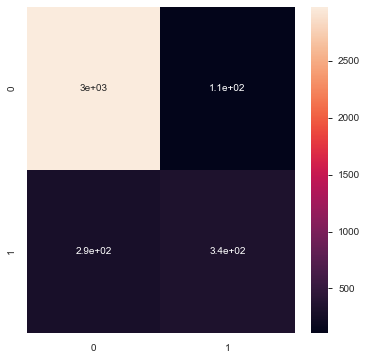

In [68]:
cm = confusion_matrix(y_test, prediction)
plt.rcParams['figure.figsize'] = (6, 6)
sns.heatmap(cm ,annot = True)

In [69]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state = 0).fit(x_test, y_test)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

C:\Users\varun\anaconda3\envs\condaenv\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning:

The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.

C:\Users\varun\anaconda3\envs\condaenv\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning:

The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.



Weight,Feature
0.1275 ± 0.0118,PageValues
0.0104 ± 0.0059,ExitRates
0.0072 ± 0.0016,Month_Nov
0.0049 ± 0.0017,ProductRelated_Duration
0.0046 ± 0.0030,ProductRelated
0.0039 ± 0.0026,BounceRates
0.0023 ± 0.0019,TrafficType
0.0016 ± 0.0018,Region
0.0014 ± 0.0012,Informational
0.0013 ± 0.0026,Administrative


In [70]:
import shap

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


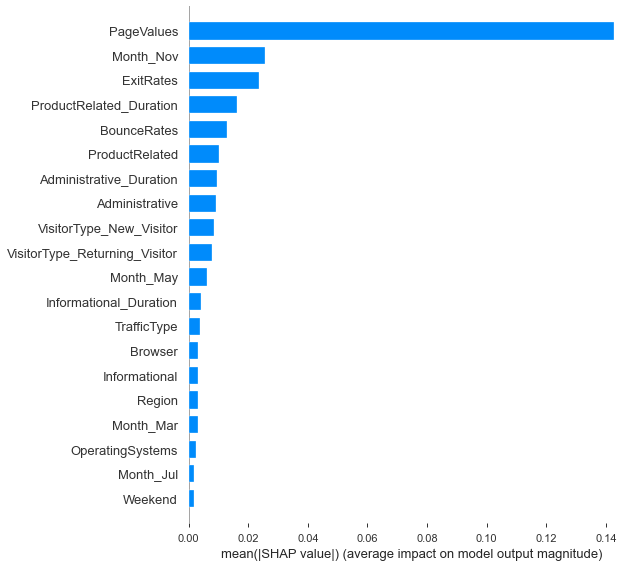

In [71]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(x_test)

shap.summary_plot(shap_values[1], x_test, plot_type = 'bar')

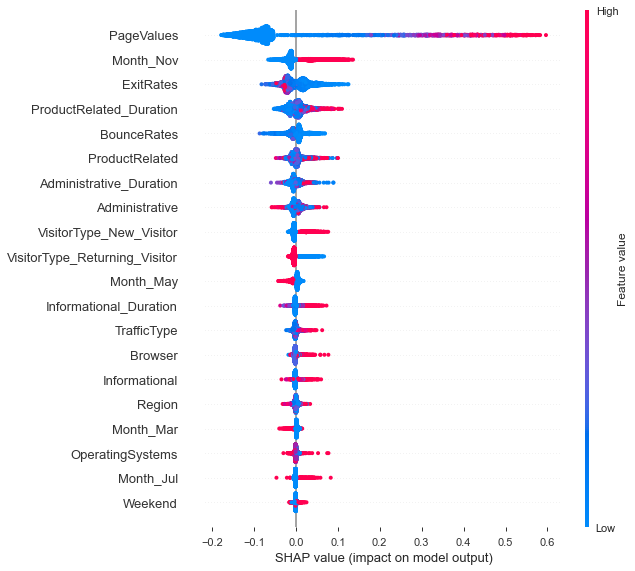

In [72]:
shap.summary_plot(shap_values[1], x_test)

### Customer Analysis

In [73]:
def customer_analysis(model, customer):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(customer)
    shap.initjs()
    return shap.force_plot(explainer.expected_value[1], shap_values[1], customer)

In [74]:
customers = x_test.iloc[1,:].astype(float)
customer_analysis(model, customers)

### Force Plot

In [75]:
shap_values = explainer.shap_values(x_train.iloc[:50])
shap.initjs()

shap.force_plot(explainer.expected_value[1], shap_values[1], x_test.iloc[:50])